In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go
%matplotlib inline

In [2]:
#Create a path to where your data is stored.
path = r'C:\Users\jinu5\Desktop\careerfoundry\ML\DataSet'

In [3]:
#Read in the European weather data.
climate = pd.read_csv(os.path.join(path, 'prepared data', 'df_scaled.csv'))
climate

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,0.660514,-0.02793,0.826097,-0.001949,-1.101066,-0.265148,-0.179228,-0.902918,...,-0.443701,0.761754,-1.299744,-0.806427,-0.088407,-0.024706,0.372147,-0.668215,-0.519743,-0.752237
1,19600102,1,0.244897,-0.02793,0.735760,-0.001949,-1.058108,1.658760,-0.179228,-0.810126,...,0.783085,1.183580,-1.262455,-1.042055,0.503361,-0.024706,-0.829285,-0.548046,-0.629054,-0.407141
2,19600103,1,1.076130,-0.02793,1.277781,-0.001949,-1.251420,0.155707,-0.179228,-1.065304,...,0.783085,1.183580,-0.432779,-1.136306,-0.396127,-0.024706,-1.009500,-0.067372,0.054135,-0.177078
3,19600104,1,-1.001953,-0.02793,1.458455,-0.001949,-0.821838,-0.445514,-0.179228,-0.114186,...,0.783085,0.480538,0.387574,-1.183432,0.669056,-0.024706,-1.039536,-0.998679,-0.164486,-0.838511
4,19600105,1,0.244897,-0.02793,1.729466,-0.001949,-0.746661,-0.164944,-0.179228,0.187388,...,-1.670486,-0.363113,1.729970,-0.794645,-0.490810,-0.024706,0.672505,-1.509396,-1.339569,-1.471186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,-1.833187,-0.02793,0.284075,1.037367,-0.005632,-0.004619,-0.179228,0.720943,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22946,20221028,10,0.244897,-0.02793,0.103401,0.976231,-0.005632,-0.004619,-0.179228,0.187388,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22947,20221029,10,-0.586336,-0.02793,0.013064,0.716402,-0.005632,-0.004619,-0.179228,0.349774,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530
22948,20221030,10,-0.170720,-0.02793,0.374412,0.487141,-0.005632,-0.004619,-0.179228,0.280180,...,-0.443701,-0.081896,-0.003958,-0.005290,-0.005560,-0.024706,-0.018319,-0.007287,-0.000520,-0.004530


In [4]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [5]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,-0.528623,-1.016876,-1.099163,-0.114356,-0.105836,-0.927601,-0.106469,-0.182904,-1.370824,-0.097084,-0.988280,-0.265742,-0.186575,-1.280450,-0.124331,-0.391072,-0.257321,-0.668215
1,19600102,1,-0.582946,-1.107669,-1.110927,-0.367511,-0.370915,-0.825294,-0.892676,-0.212437,-1.043881,-0.232112,-0.691740,-0.353714,-0.368598,-0.539569,-0.650834,-0.415953,-0.335759,-0.548046
2,19600103,1,-0.257010,-1.084971,-1.063873,-0.509912,-0.532908,-0.940389,-0.490837,-0.389635,-0.741156,-0.487164,-0.853490,-0.403983,-0.550620,-0.876333,-0.650834,-0.615003,-0.210258,-0.067372
3,19600104,1,-0.555784,-1.209812,-1.146217,-0.525734,-0.577088,-1.042696,-0.316124,-0.493001,-0.910682,-0.472161,-0.624345,-0.642763,-0.417137,-0.775304,-0.943336,-0.764290,-0.069069,-0.998679
4,19600105,1,-1.003946,-1.209812,-1.087400,-0.320045,-0.444548,-0.978754,-0.403481,-0.552067,-0.862246,-0.307127,-0.381721,-0.906678,-0.332193,-0.926848,-0.621584,-0.503037,-0.037694,-1.509396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,0.747959,0.628750,-0.005167,0.898267,1.042841,0.440753,0.906865,-0.005705,0.481853,1.268193,0.683127,0.664244,0.395898,-0.000746,0.826301,0.517090,1.295755,-0.007287
22946,20221028,10,0.856604,0.367720,-0.005167,0.945734,1.278467,0.466330,0.802037,-0.005705,0.263891,1.313202,0.561815,0.890456,0.541516,-0.000746,1.074927,0.641496,1.358505,-0.007287
22947,20221029,10,0.856604,0.083991,-0.005167,0.914089,1.101748,0.786039,0.924336,-0.005705,0.300218,1.208181,0.548336,1.053832,0.395898,-0.000746,1.221178,0.716139,1.405568,-0.007287
22948,20221030,10,0.680055,0.265577,-0.005167,0.692578,0.880848,0.376811,0.697210,-0.005705,0.397090,0.923123,0.103526,0.689378,-0.065226,-0.000746,1.235803,0.019467,0.668249,-0.007287


In [ ]:
#You'll need to reduce the dataset to only one year of data. Analyze and pick which year you want to use.

In [6]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp = df.drop(['DATE','MONTH'], axis=1)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

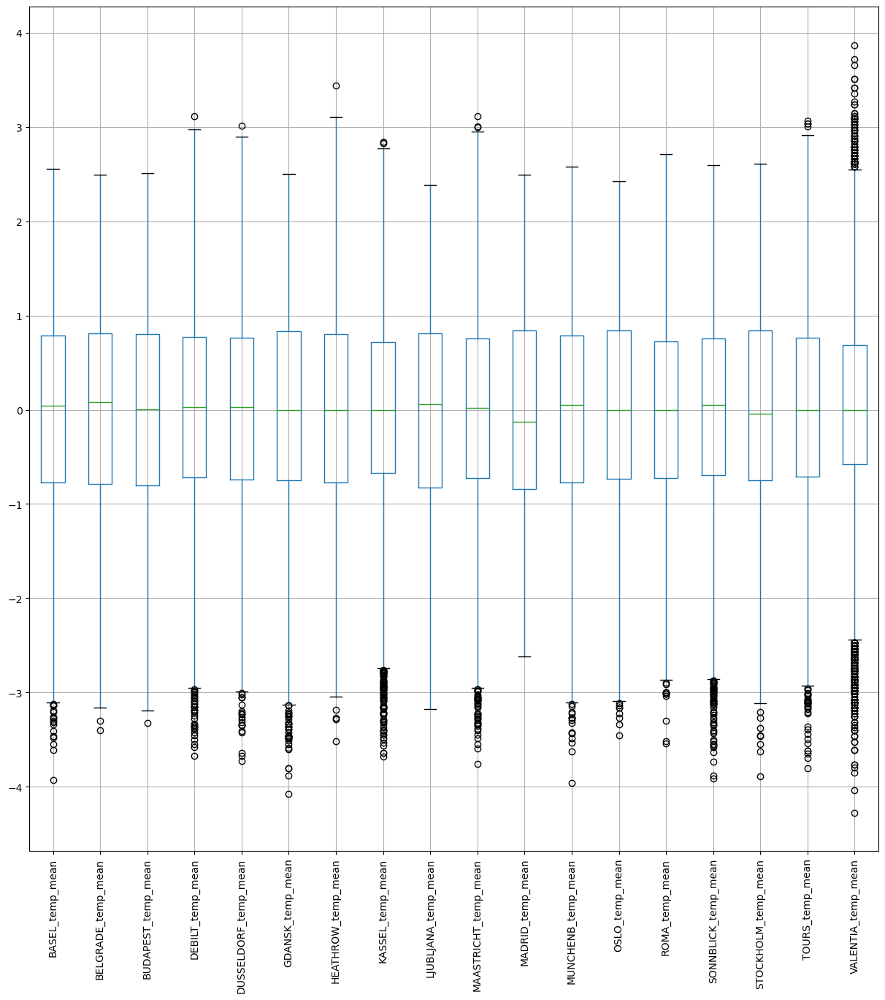

In [7]:
#Look at a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

In [6]:
#Reduce your dataset to a single year
dfyear = df[df['DATE'].astype(str).str.contains('2021')] #<-----INSERT YEAR HERE
dfyear.head(20)

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
771,19620210,2,-1.139752,-1.289256,-1.169744,-0.937112,-0.974707,-0.914813,-1.137274,-0.965530,-1.068099,-1.057280,-1.338737,-1.145458,-0.477811,-0.707951,-0.723959,-0.453275,-1.261329,-0.247625
772,19620211,2,-1.139752,-1.380049,-1.216797,-0.921290,-0.989434,-0.659045,-1.049918,-0.847397,-1.201298,-0.892246,-1.217425,-1.120324,-0.635564,-0.556407,-0.811710,-0.615003,-0.665199,-0.728299
773,19620212,2,-0.528623,-0.892036,-1.122690,-0.399156,-0.488728,-0.710199,-0.735435,-0.670199,-0.934900,-0.517170,-0.893927,-0.177771,-0.866127,-0.876333,-0.738584,-0.851374,-1.010327,-0.548046
774,19620213,2,-1.085430,-0.369975,-0.628627,-1.174445,-1.372326,-1.119426,-1.014975,-1.187028,-0.862246,-1.282325,-0.826531,-0.956948,-0.951071,-1.213097,-1.104212,-1.436081,-0.602449,-1.148890
775,19620214,2,-1.465688,-1.391398,-1.099163,-1.316845,-1.401779,-1.196156,-1.539113,-1.438059,-1.201298,-1.492368,-0.988280,-1.497345,-1.120958,-1.431994,-2.332720,-1.510724,-1.449581,-1.569480
776,19620215,2,-1.587914,-1.607032,-1.416775,-1.269379,-1.475413,-1.439135,-1.294515,-1.526658,-1.322388,-1.447359,-1.325258,-1.748692,-1.557813,-2.021331,-2.873848,-1.908823,-1.465269,-1.269058
777,19620216,2,-0.691591,-1.709174,-1.628516,-0.430800,-0.518182,-1.081061,-0.980032,-0.611133,-1.164971,-0.532173,-1.298299,-0.705600,-0.356463,-2.156037,-1.747716,-0.913576,-0.806388,-0.457920
778,19620217,2,-0.990365,-1.153066,-0.922712,-0.889645,-1.048340,-1.081061,-0.875205,-0.847397,-0.801701,-1.057280,-0.947843,-1.032352,-0.671969,-1.011039,-1.513715,-1.560487,-0.727950,-0.337751
779,19620218,2,-1.166914,-1.311954,-1.146217,-0.842178,-0.915801,-1.157791,-0.822791,-0.906464,-0.813810,-1.072283,-0.893927,-1.208295,-1.084554,-1.314127,-2.157219,-1.610249,-1.073078,-0.698257
780,19620219,2,-1.180494,-1.334652,-1.099163,-0.636489,-0.797988,-0.914813,-0.805320,-0.581600,-1.043881,-0.757219,-0.705220,-0.894111,-0.587025,-1.583538,-1.148087,-1.100185,-1.041702,-0.698257


In [7]:
dfyear = df[df['DATE'].astype(str).str.startswith('2021')]

In [10]:
dfyear.head(20)

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22281,20210101,1,-1.112591,-0.653703,-0.005167,-1.111156,-1.239786,-1.272886,-1.713826,-0.005705,-0.995445,-1.222313,-1.473528,-1.107756,-0.744778,-0.000746,-1.206588,-0.540359,-1.496644,-0.007287
22282,20210102,1,-1.221236,-0.551561,-0.005167,-1.016223,-1.195607,-1.081061,-1.504171,-0.005705,-0.741156,-1.282325,-1.716151,-1.271132,-0.671969,-0.000746,-0.884835,-0.702087,-1.763333,-0.007287
22283,20210103,1,-1.384204,-0.415371,-0.005167,-1.063690,-1.136700,-1.042696,-1.381872,-0.005705,-0.862246,-1.207310,-1.608319,-1.208295,-0.951071,-0.000746,-1.016461,-0.938458,-1.465269,-0.007287
22284,20210104,1,-1.329882,-0.517514,-0.005167,-1.142801,-1.269240,-0.940389,-1.259573,-0.005705,-0.886464,-1.297328,-1.648756,-1.245997,-1.145228,-0.000746,-1.191962,-0.863814,-1.575082,-0.007287
22285,20210105,1,-1.384204,-0.699100,-0.005167,-1.126979,-1.239786,-0.799717,-1.399343,-0.005705,-0.874355,-1.267322,-1.810505,-1.296267,-1.582083,-0.000746,-1.382089,-0.975779,-1.496644,-0.007287
22286,20210106,1,-1.384204,-0.619656,-0.005167,-1.206090,-1.180880,-0.902024,-1.189688,-0.005705,-1.152862,-1.222313,-1.823984,-1.283700,-1.873319,-0.000746,-1.382089,-1.125066,-1.402518,-0.007287
22287,20210107,1,-1.234817,-0.755846,-0.005167,-1.174445,-1.328146,-0.991543,-1.783711,-0.005705,-1.164971,-1.312331,-1.958775,-1.132891,-1.424330,-0.000746,-1.703841,-0.913576,-1.386830,-0.007287
22288,20210108,1,-1.397785,-1.073622,-0.005167,-1.411779,-1.431233,-0.965966,-1.906010,-0.005705,-1.164971,-1.387347,-2.066608,-1.145458,-1.339386,-0.000746,-1.981718,-0.838933,-1.826084,-0.007287
22289,20210109,1,-1.682979,-1.402747,-0.005167,-1.680757,-1.490139,-1.004331,-1.766240,-0.005705,-1.407151,-1.537377,-2.093566,-1.283700,-1.387925,-0.000746,-1.776966,-0.975779,-1.888835,-0.007287
22290,20210110,1,-1.601495,-1.425445,-0.005167,-1.332668,-1.460686,-0.953178,-1.608998,-0.005705,-1.395042,-1.447359,-1.850942,-1.736125,-1.218037,-0.000746,-1.747716,-0.975779,-1.575082,-0.007287


In [13]:
dfyear.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02
mean,2.021067e+07,6.526027,0.032909,0.128766,-5.166671e-03,0.072520,0.013712,0.088705,0.085045,-5.705221e-03,0.101863,0.062647,0.089456,0.090138,0.102767,-7.461640e-04,0.045401,0.099155,0.116518,-7.287352e-03
std,3.454755e+02,3.452584,0.949455,1.005278,1.042263e-17,0.966594,0.975583,1.066883,1.010767,3.039933e-17,1.014904,0.964474,1.009745,0.926124,1.061531,4.777038e-18,1.026706,1.048349,0.985446,4.603327e-17
min,2.021010e+07,1.000000,-2.212624,-2.049648,-5.166671e-03,-2.503513,-2.668269,-2.986526,-2.185550,-5.705221e-03,-1.855184,-2.572588,-2.470980,-2.125714,-2.152421,-7.461640e-04,-2.815348,-2.294481,-2.281025,-7.287352e-03
25%,2.021040e+07,4.000000,-0.745913,-0.631005,-5.166671e-03,-0.683956,-0.680175,-0.748564,-0.683021,-5.705221e-03,-0.704829,-0.667200,-0.664782,-0.667898,-0.574890,-7.461640e-04,-0.636209,-0.577681,-0.649512,-7.287352e-03
50%,2.021070e+07,7.000000,-0.012558,-0.040850,-5.166671e-03,0.043867,-0.061656,-0.006839,-0.001641,-5.705221e-03,-0.087270,-0.022069,-0.085181,0.035875,0.068257,-7.461640e-04,0.036546,0.019467,0.056432,-7.287352e-03
75%,2.021100e+07,10.000000,0.883765,0.935177,-5.166671e-03,0.993200,0.880848,1.029017,0.994221,-5.705221e-03,0.941995,0.923123,0.817918,0.865322,1.063315,-7.461640e-04,0.855551,0.940070,0.966314,-7.287352e-03
max,2.021123e+07,12.000000,2.078863,2.263027,-5.166671e-03,2.211512,2.559684,2.320641,2.391923,-5.705221e-03,2.092351,2.423428,2.489325,2.109492,2.082643,-7.461640e-04,2.215685,2.358296,2.111511,-7.287352e-03


In [ ]:
#Pick which weather station you want to use. Below is a 3D visualization of the temperatures for that year.


In [19]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear.drop(['DATE','MONTH'], axis=1)

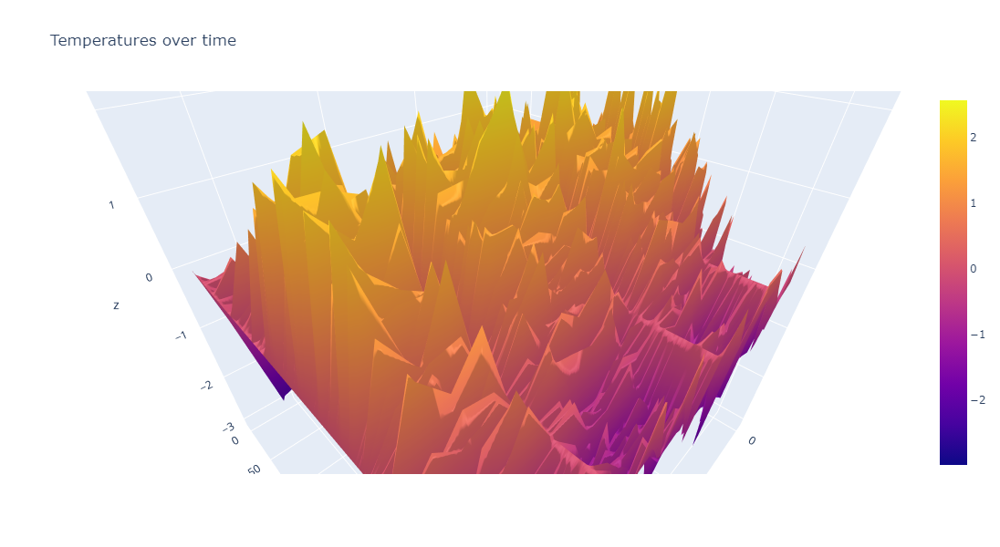

In [15]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [11]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [18]:
n_rows = dfyear.shape[0]
n_rows

365

In [19]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)
X

array([[0.01],
       [0.02],
       [0.03],
       [0.04],
       [0.05],
       [0.06],
       [0.07],
       [0.08],
       [0.09],
       [0.1 ],
       [0.11],
       [0.12],
       [0.13],
       [0.14],
       [0.15],
       [0.16],
       [0.17],
       [0.18],
       [0.19],
       [0.2 ],
       [0.21],
       [0.22],
       [0.23],
       [0.24],
       [0.25],
       [0.26],
       [0.27],
       [0.28],
       [0.29],
       [0.3 ],
       [0.31],
       [0.32],
       [0.33],
       [0.34],
       [0.35],
       [0.36],
       [0.37],
       [0.38],
       [0.39],
       [0.4 ],
       [0.41],
       [0.42],
       [0.43],
       [0.44],
       [0.45],
       [0.46],
       [0.47],
       [0.48],
       [0.49],
       [0.5 ],
       [0.51],
       [0.52],
       [0.53],
       [0.54],
       [0.55],
       [0.56],
       [0.57],
       [0.58],
       [0.59],
       [0.6 ],
       [0.61],
       [0.62],
       [0.63],
       [0.64],
       [0.65],
       [0.66],
       [0.

In [20]:
ones = np.ones((n_rows,1))
ones.shape

(365, 1)

In [21]:
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, index.to_numpy().reshape(n_rows, 1)), axis=1)
X

array([[1.  , 0.01],
       [1.  , 0.02],
       [1.  , 0.03],
       [1.  , 0.04],
       [1.  , 0.05],
       [1.  , 0.06],
       [1.  , 0.07],
       [1.  , 0.08],
       [1.  , 0.09],
       [1.  , 0.1 ],
       [1.  , 0.11],
       [1.  , 0.12],
       [1.  , 0.13],
       [1.  , 0.14],
       [1.  , 0.15],
       [1.  , 0.16],
       [1.  , 0.17],
       [1.  , 0.18],
       [1.  , 0.19],
       [1.  , 0.2 ],
       [1.  , 0.21],
       [1.  , 0.22],
       [1.  , 0.23],
       [1.  , 0.24],
       [1.  , 0.25],
       [1.  , 0.26],
       [1.  , 0.27],
       [1.  , 0.28],
       [1.  , 0.29],
       [1.  , 0.3 ],
       [1.  , 0.31],
       [1.  , 0.32],
       [1.  , 0.33],
       [1.  , 0.34],
       [1.  , 0.35],
       [1.  , 0.36],
       [1.  , 0.37],
       [1.  , 0.38],
       [1.  , 0.39],
       [1.  , 0.4 ],
       [1.  , 0.41],
       [1.  , 0.42],
       [1.  , 0.43],
       [1.  , 0.44],
       [1.  , 0.45],
       [1.  , 0.46],
       [1.  , 0.47],
       [1.  ,

In [22]:
y=dfyear['BASEL_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [23]:
X.shape, y.shape

((365, 2), (365, 1))

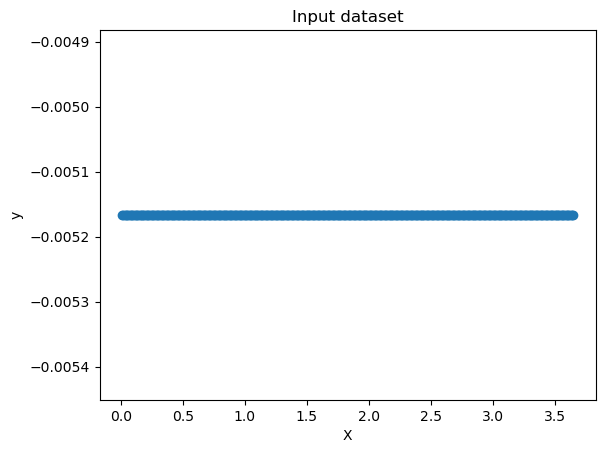

In [33]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['BUDAPEST_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [29]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear['BUDAPEST_temp_mean'].min()

-0.005166671

In [30]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear['BUDAPEST_temp_mean'].max()

-0.005166671

# ????????????????????????????????

In [31]:
dfyear

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22281,20210101,1,-1.112591,-0.653703,-0.005167,-1.111156,-1.239786,-1.272886,-1.713826,-0.005705,-0.995445,-1.222313,-1.473528,-1.107756,-0.744778,-0.000746,-1.206588,-0.540359,-1.496644,-0.007287
22282,20210102,1,-1.221236,-0.551561,-0.005167,-1.016223,-1.195607,-1.081061,-1.504171,-0.005705,-0.741156,-1.282325,-1.716151,-1.271132,-0.671969,-0.000746,-0.884835,-0.702087,-1.763333,-0.007287
22283,20210103,1,-1.384204,-0.415371,-0.005167,-1.063690,-1.136700,-1.042696,-1.381872,-0.005705,-0.862246,-1.207310,-1.608319,-1.208295,-0.951071,-0.000746,-1.016461,-0.938458,-1.465269,-0.007287
22284,20210104,1,-1.329882,-0.517514,-0.005167,-1.142801,-1.269240,-0.940389,-1.259573,-0.005705,-0.886464,-1.297328,-1.648756,-1.245997,-1.145228,-0.000746,-1.191962,-0.863814,-1.575082,-0.007287
22285,20210105,1,-1.384204,-0.699100,-0.005167,-1.126979,-1.239786,-0.799717,-1.399343,-0.005705,-0.874355,-1.267322,-1.810505,-1.296267,-1.582083,-0.000746,-1.382089,-0.975779,-1.496644,-0.007287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22641,20211227,12,-0.515042,-1.277907,-0.005167,-0.699778,-0.621268,-2.180860,-0.473366,-0.005705,-0.910682,-0.292124,-0.368242,-0.554792,-1.812645,-0.000746,-0.606959,-1.398759,-0.037694,-0.007287
22642,20211228,12,-0.012558,-1.130368,-0.005167,-0.193467,-0.297282,-1.925093,-0.211297,-0.005705,-0.595848,-0.142094,-0.476075,-0.328579,-1.387925,-0.000746,-0.387582,-0.926017,0.025056,-0.007287
22643,20211229,12,-0.107623,-0.846639,-0.005167,-0.082711,-0.150016,-1.285675,-0.001641,-0.005705,-0.971227,-0.052075,-0.691740,-0.114934,-1.497139,-0.000746,-0.475333,-0.826492,0.134870,-0.007287
22644,20211230,12,0.354120,-0.846639,-0.005167,0.455245,0.424323,-0.876447,0.208014,-0.005705,-0.910682,0.503038,-0.691740,0.400329,-0.853992,-0.000746,0.051171,-0.577681,0.307434,-0.007287


In [32]:
dfyear.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,3.650000e+02,365.000000,365.000000,365.000000,3.650000e+02
mean,2.021067e+07,6.526027,0.032909,0.128766,-5.166671e-03,0.072520,0.013712,0.088705,0.085045,-5.705221e-03,0.101863,0.062647,0.089456,0.090138,0.102767,-7.461640e-04,0.045401,0.099155,0.116518,-7.287352e-03
std,3.454755e+02,3.452584,0.949455,1.005278,1.042263e-17,0.966594,0.975583,1.066883,1.010767,3.039933e-17,1.014904,0.964474,1.009745,0.926124,1.061531,4.777038e-18,1.026706,1.048349,0.985446,4.603327e-17
min,2.021010e+07,1.000000,-2.212624,-2.049648,-5.166671e-03,-2.503513,-2.668269,-2.986526,-2.185550,-5.705221e-03,-1.855184,-2.572588,-2.470980,-2.125714,-2.152421,-7.461640e-04,-2.815348,-2.294481,-2.281025,-7.287352e-03
25%,2.021040e+07,4.000000,-0.745913,-0.631005,-5.166671e-03,-0.683956,-0.680175,-0.748564,-0.683021,-5.705221e-03,-0.704829,-0.667200,-0.664782,-0.667898,-0.574890,-7.461640e-04,-0.636209,-0.577681,-0.649512,-7.287352e-03
50%,2.021070e+07,7.000000,-0.012558,-0.040850,-5.166671e-03,0.043867,-0.061656,-0.006839,-0.001641,-5.705221e-03,-0.087270,-0.022069,-0.085181,0.035875,0.068257,-7.461640e-04,0.036546,0.019467,0.056432,-7.287352e-03
75%,2.021100e+07,10.000000,0.883765,0.935177,-5.166671e-03,0.993200,0.880848,1.029017,0.994221,-5.705221e-03,0.941995,0.923123,0.817918,0.865322,1.063315,-7.461640e-04,0.855551,0.940070,0.966314,-7.287352e-03
max,2.021123e+07,12.000000,2.078863,2.263027,-5.166671e-03,2.211512,2.559684,2.320641,2.391923,-5.705221e-03,2.092351,2.423428,2.489325,2.109492,2.082643,-7.461640e-04,2.215685,2.358296,2.111511,-7.287352e-03


## (UN)fortunately, the data of year & location I chose - 2021, Budapest is not normal. I checked the data in 2021 again, and found that some location like Kassel, Roma, etc. have same issue. 

## We don't know exactly now, but we record this because it may affect machine learning. 

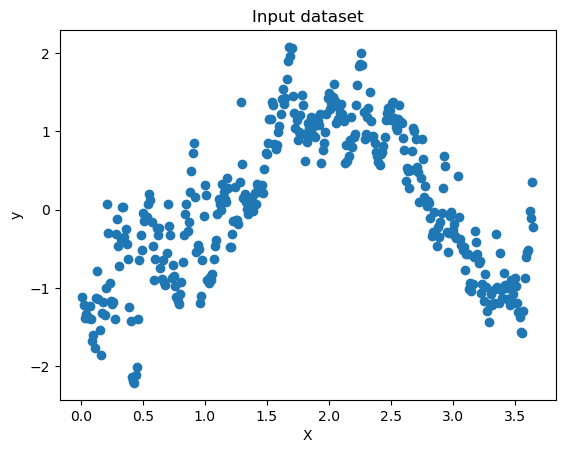

In [24]:
# change the location from Budapest to BASEL
y=dfyear['BASEL_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE
X.shape, y.shape
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['BASEL_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [25]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [26]:
compute_cost(X,y)

array([0.45003918])

In [27]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [28]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=30#<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[-1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 15.6 ms
Wall time: 41.4 ms


array([[ 0.82303785],
       [-0.30862993]])

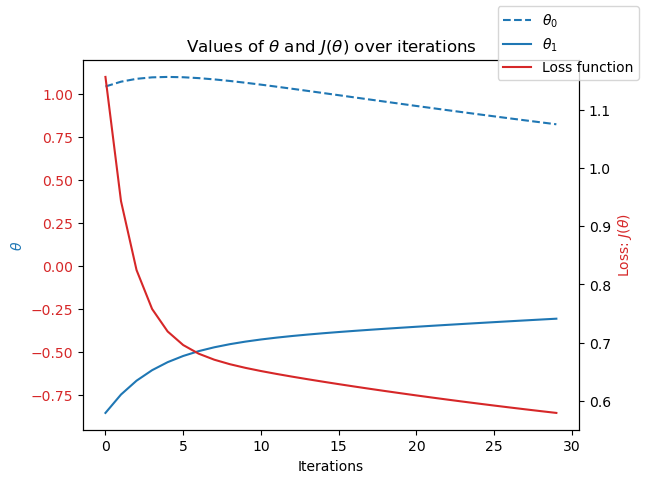

In [29]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

In [30]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 719 ms
Wall time: 2.73 s


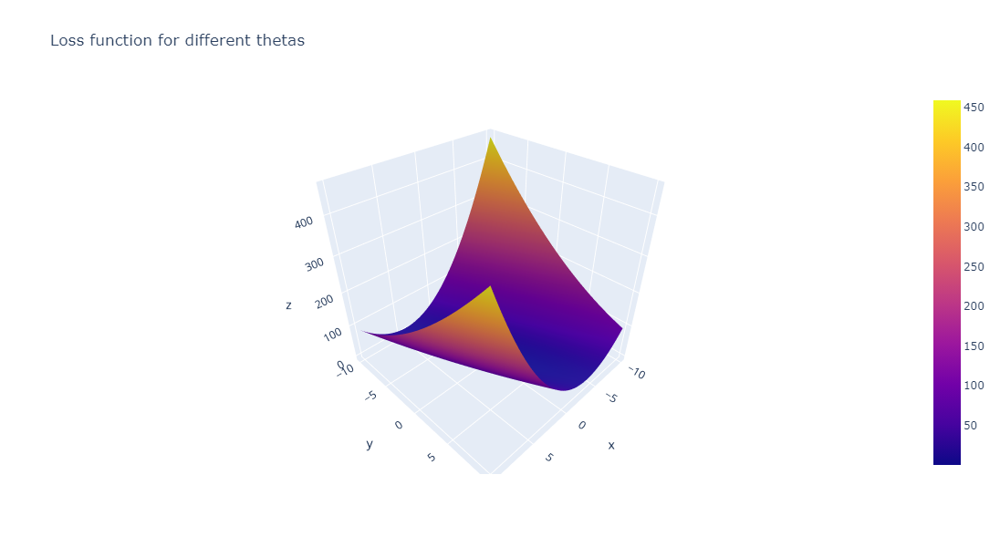

In [31]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

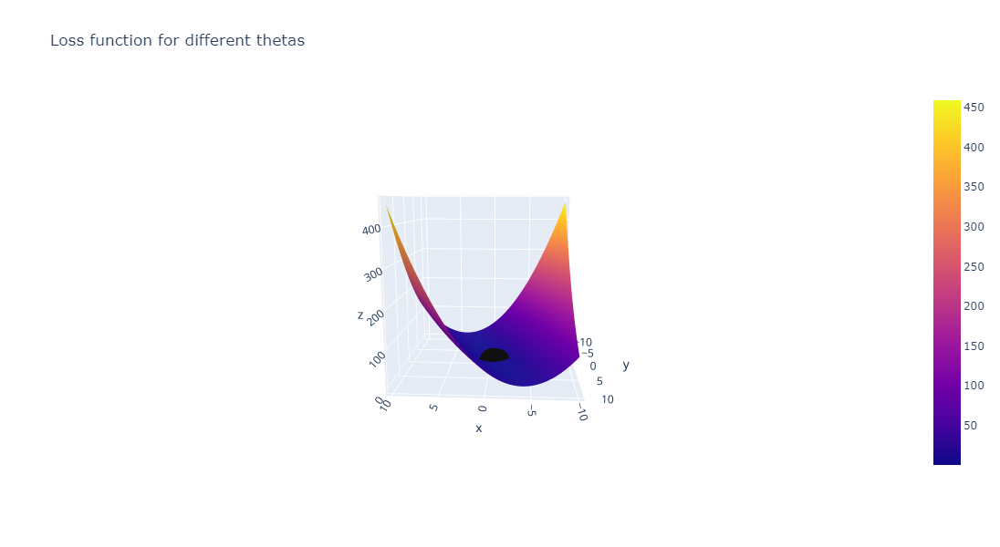

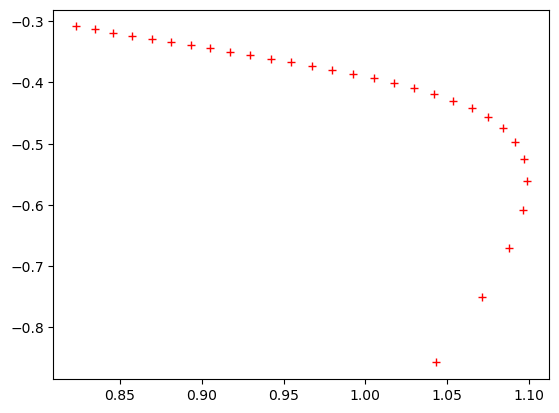

In [41]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [42]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=30 #<---start with the same iterations as above
theta_init=np.array([[-0.5],[-1.10]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.01 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

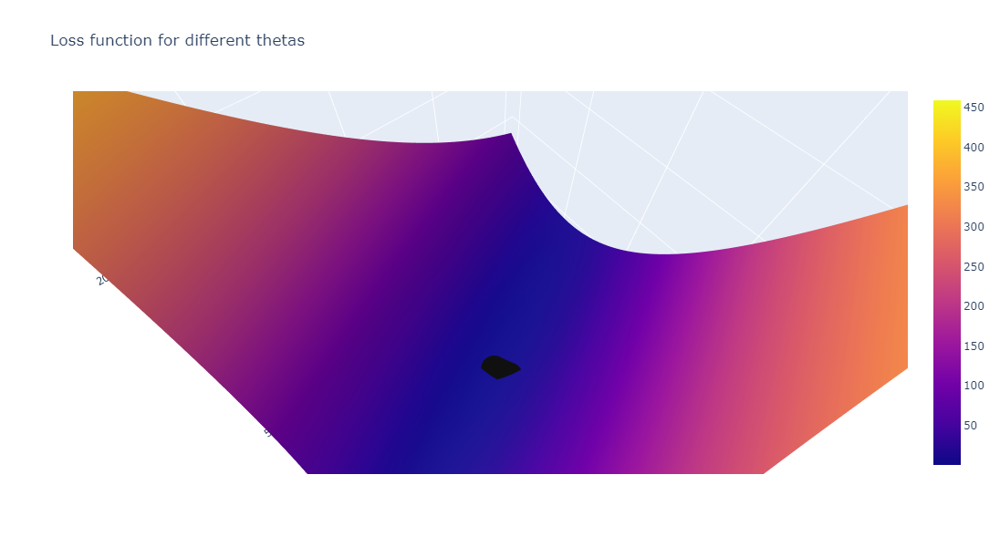

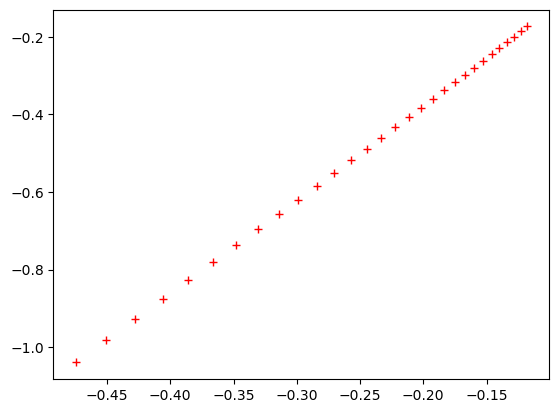

In [43]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

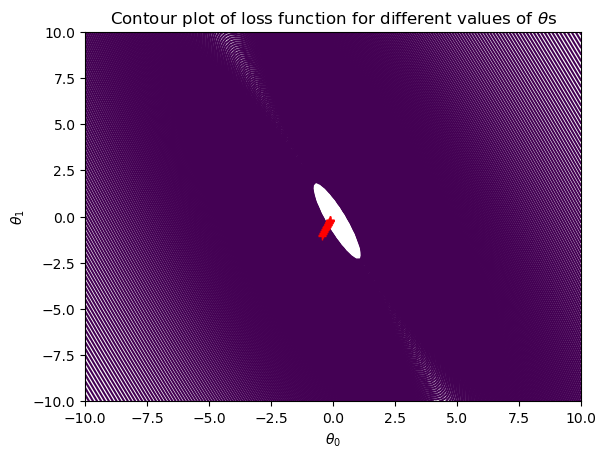

In [44]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');

In [ ]:
#How well does gradient descent converge? How much do you need to adjust between different weather stations and years?

## Investigate at least three different weather stations and three different years and find values where the gradient descent converges.
Take screenshots of the loss function and profiles (similar to the images above) and paste them in a document along with the starting and ending theta0, theta1, iterations, and step sizes for each year and station you investigate.

## Bael 2010

In [53]:
dfyear = df[df['DATE'].astype(str).str.contains('2010')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('2010')]
y=dfyear['BASEL_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [54]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=15 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-0.5],[1.1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 0 ns
Wall time: 13.3 ms


array([[-0.74479474],
       [ 0.33625032]])

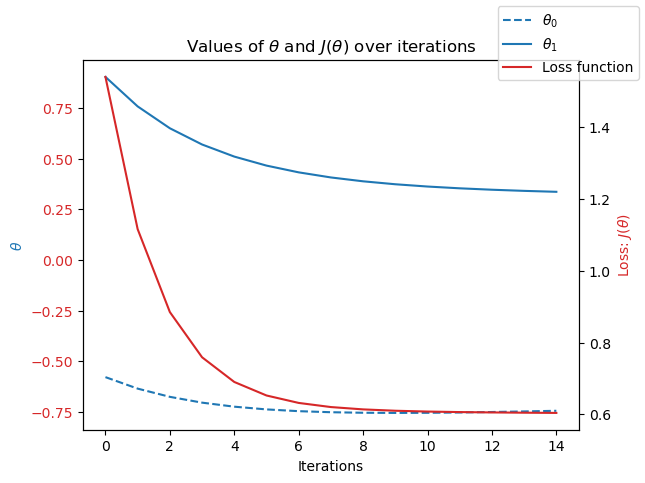

In [55]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

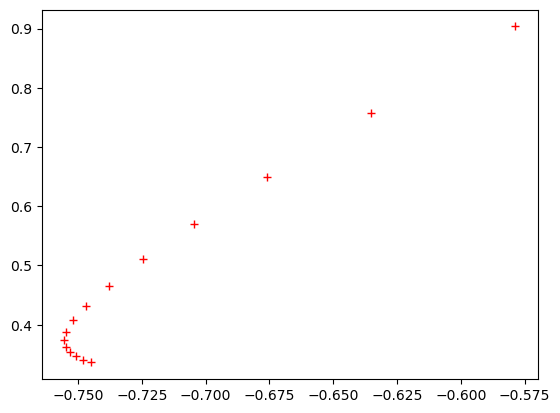

In [57]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## BASEL 1998

In [58]:
dfyear = df[df['DATE'].astype(str).str.contains('1998')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('1998')]
y=dfyear['BASEL_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [59]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=30 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-0.1],[0.5]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 15.6 ms
Wall time: 32.3 ms


array([[-0.20958018],
       [ 0.20838722]])

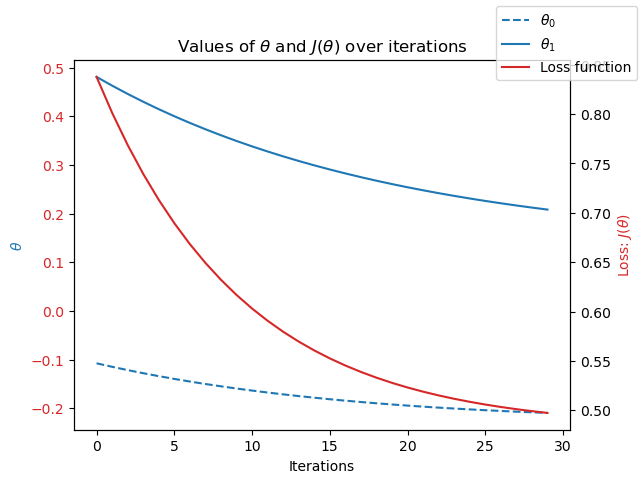

In [60]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

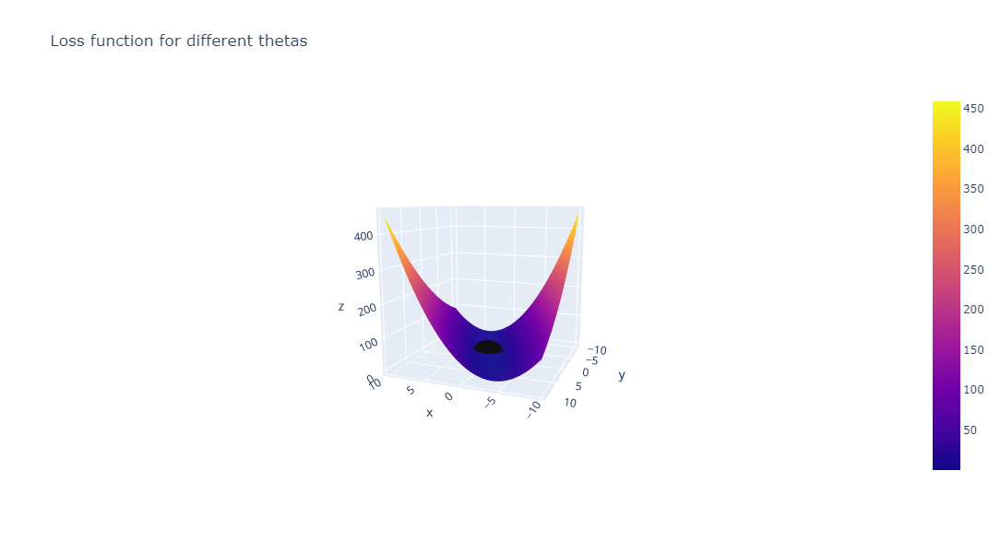

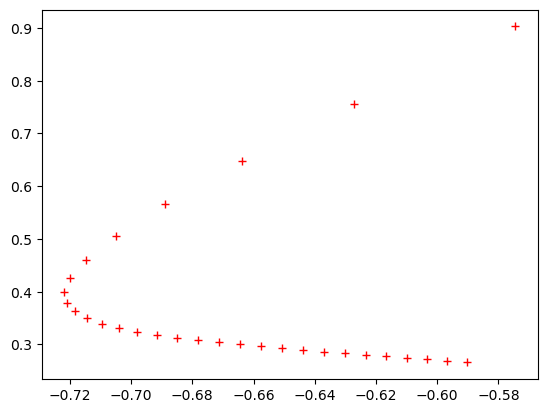

In [46]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## STOCLHOLM 1: 2019

In [62]:
dfyear = df[df['DATE'].astype(str).str.contains('2019')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('2019')]
y=dfyear['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [63]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=30 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[1],[1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 15.6 ms
Wall time: 25.2 ms


array([[ 0.31185703],
       [-0.02013077]])

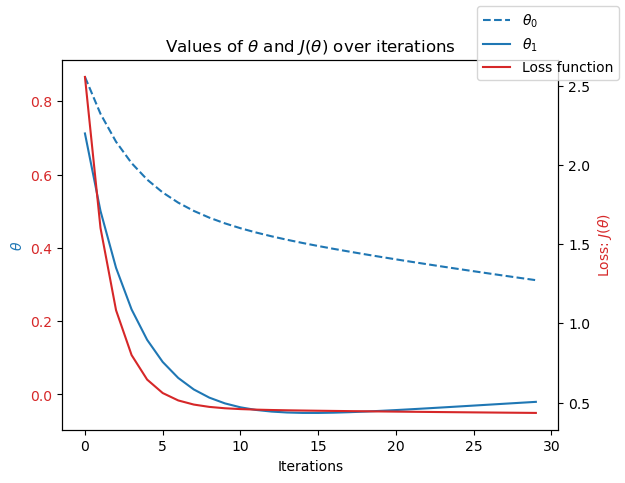

In [64]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

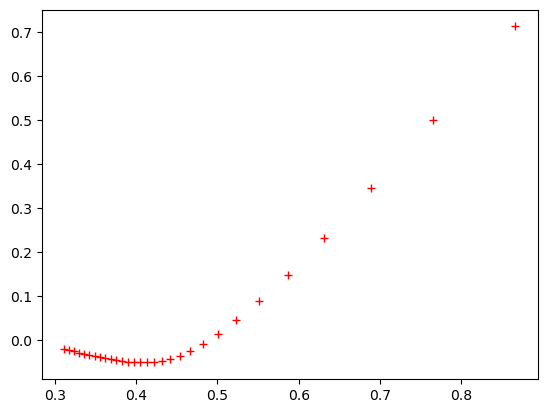

In [65]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## STOCKHOLM 2: 2005

In [70]:
dfyear = df[df['DATE'].astype(str).str.contains('2005')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('2005')]
y=dfyear['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [71]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=15 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-2],[0.1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 0 ns
Wall time: 14.8 ms


array([[-1.49680181],
       [ 0.71812687]])

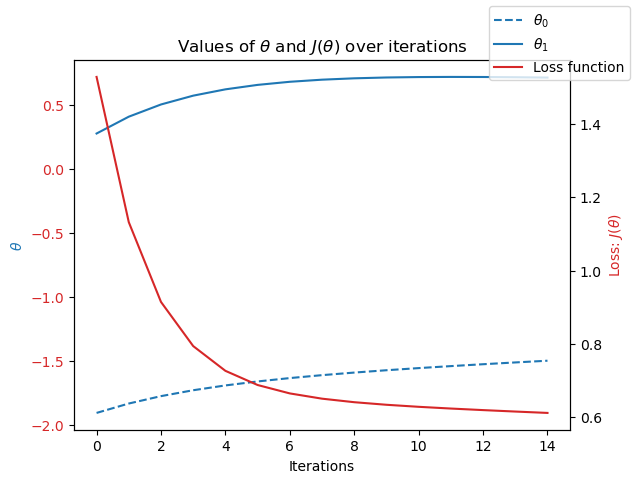

In [72]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

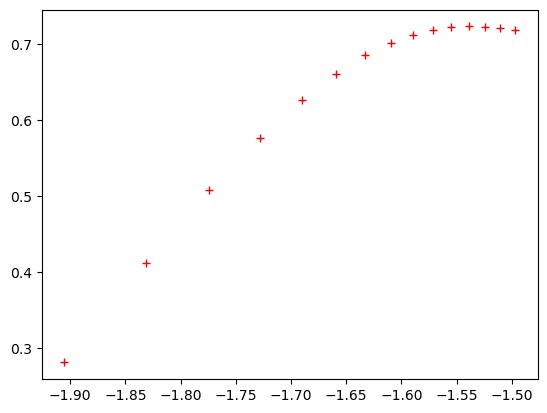

In [73]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## STOCKHOLM 3: 1995

In [74]:
dfyear = df[df['DATE'].astype(str).str.contains('1995')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('1995')]
y=dfyear['STOCKHOLM_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [75]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=15 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-0.5],[1.1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 0 ns
Wall time: 18.2 ms


array([[-0.72696776],
       [ 0.33896967]])

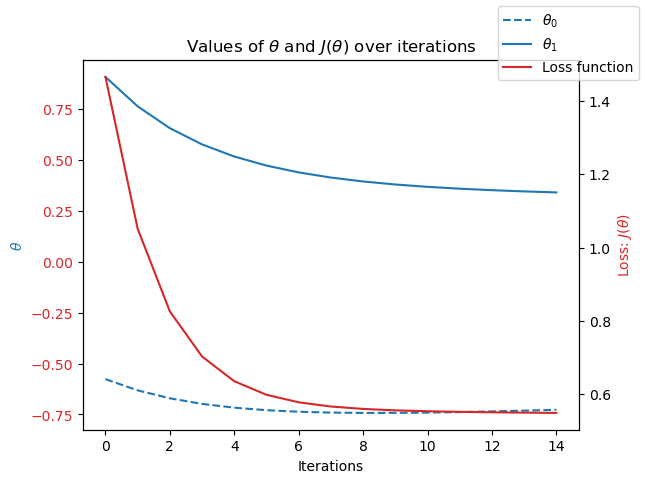

In [76]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

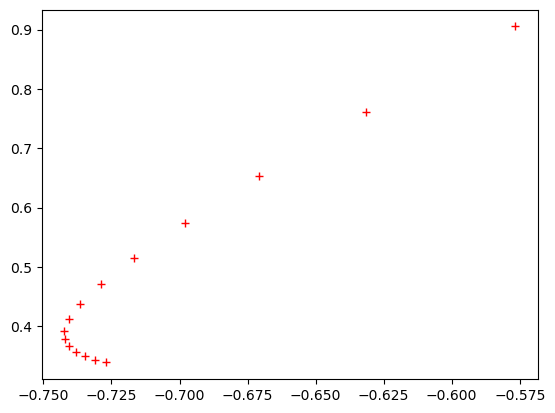

In [77]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## VALENTIA 1: 2021

In [84]:
dfyear = df[df['DATE'].astype(str).str.contains('2021')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('2021')]
y=dfyear['VALENTIA_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [88]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=1000 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0.5],[0.5]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.0001#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 312 ms
Wall time: 921 ms


array([[0.3882126 ],
       [0.25471709]])

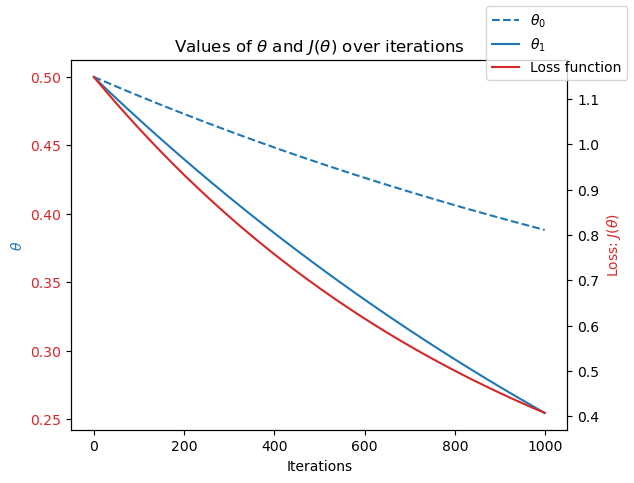

In [89]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

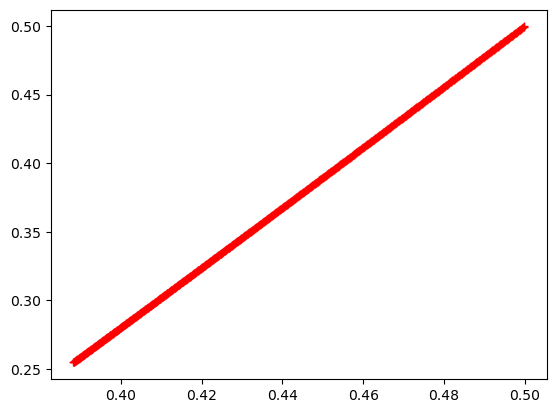

In [90]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## VALENTIA 2: 2007


In [99]:
dfyear = df[df['DATE'].astype(str).str.contains('2007')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('2007')]
y=dfyear['VALENTIA_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [100]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=5000 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0.5],[-1]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.001#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 1 s
Wall time: 3.76 s


array([[0.10816721],
       [0.1654668 ]])

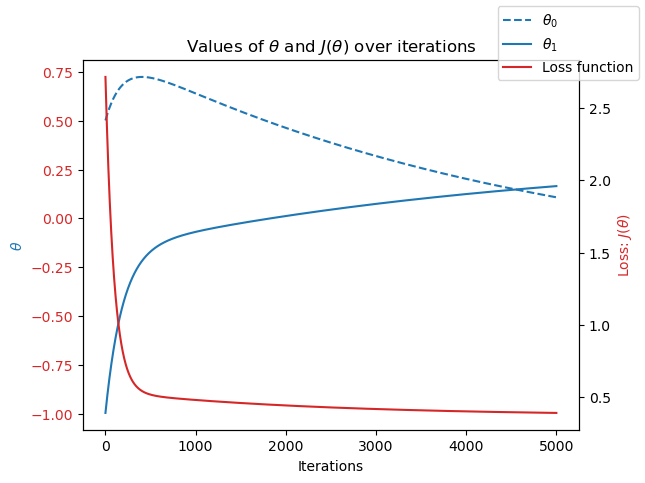

In [101]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

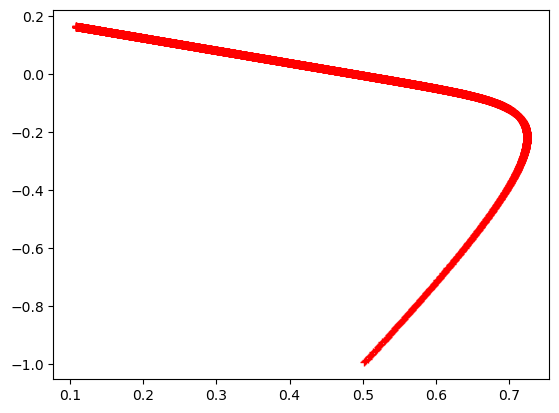

In [102]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## VALENTIA 3: 1998

In [103]:
dfyear = df[df['DATE'].astype(str).str.contains('1998')] #<-----INSERT YEAR HERE
dfyear = df[df['DATE'].astype(str).str.startswith('1998')]
y=dfyear['VALENTIA_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [104]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-0.1],[0.3]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.001#<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)
theta

CPU times: total: 344 ms
Wall time: 552 ms


array([[-0.15834828],
       [ 0.22357141]])

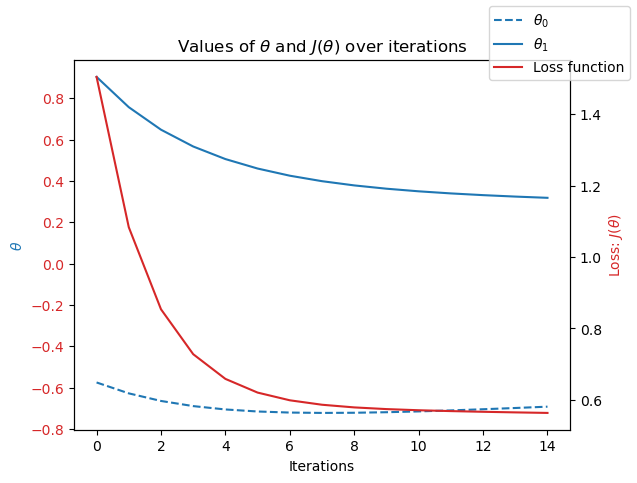

In [52]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

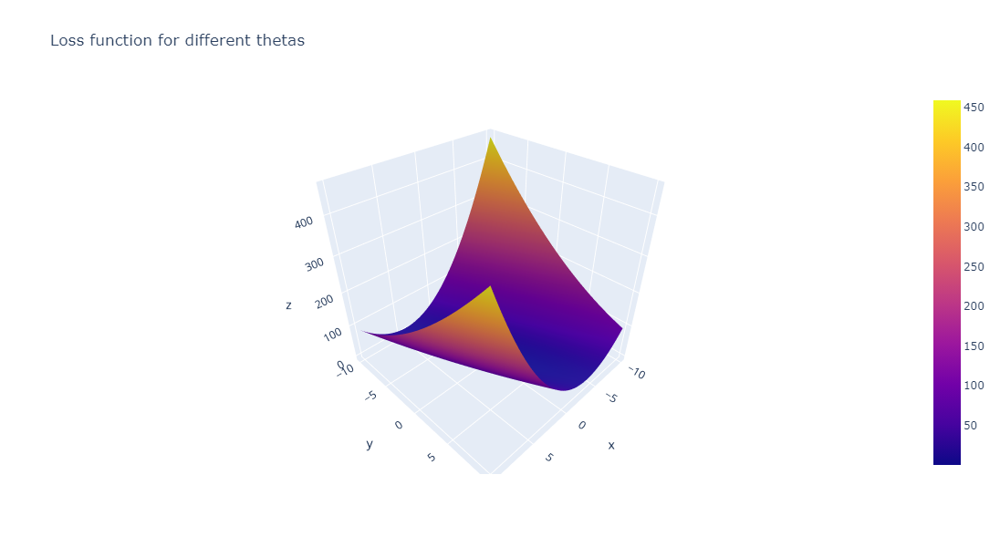

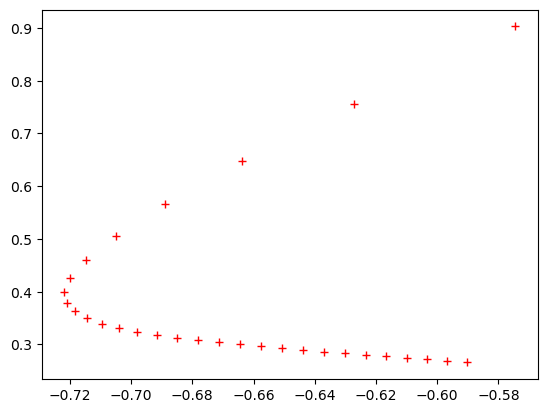

In [46]:

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()